In [1]:
%pylab inline
import numpy as np
import pandas as pd
import os
import re
import sklearn
import scipy
from sklearn.preprocessing import StandardScaler

Populating the interactive namespace from numpy and matplotlib


In [2]:
from sklearn.cluster import FeatureAgglomeration

In [3]:
fa=FeatureAgglomeration(n_clusters=1,affinity='cosine',linkage='average')

# Loading DATA

In [2]:
train_poi_dataframe=pd.read_table('./training_data/poi_matrix',index_col=0)

In [3]:
test_poi_dataframe=pd.read_table('./test_set/poi_matrix',index_col=0)

In [4]:
feature_importances=pd.read_table('./training_data/feature_importance',index_col=0)

In [7]:
train_poi_dataframe

,1,1#1,1#10,1#11,1#2,1#3,1#4,1#5,1#6,1#7,...,7#1,7#2,7#3,8,8#1,8#2,8#3,8#4,8#5,9#1#1
region_id,,,,,,,,,,,,,,,,,,,,,
12.0,4482.0,415.0,249.0,2241.0,2822.0,498.0,249.0,12367.0,83.0,166.0,...,0.0,0.0,0.0,166.0,664.0,8798.0,5229.0,7387.0,83.0,0.0
43.0,83.0,332.0,0.0,83.0,83.0,0.0,166.0,0.0,249.0,83.0,...,0.0,0.0,0.0,0.0,0.0,249.0,0.0,166.0,0.0,0.0
13.0,0.0,166.0,0.0,166.0,83.0,0.0,83.0,913.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,996.0,0.0,830.0,0.0,0.0
17.0,166.0,0.0,0.0,498.0,166.0,0.0,83.0,664.0,83.0,0.0,...,0.0,0.0,0.0,83.0,166.0,996.0,166.0,747.0,0.0,0.0
44.0,0.0,0.0,0.0,332.0,83.0,0.0,0.0,83.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,332.0,166.0,332.0,0.0,0.0
39.0,83.0,0.0,0.0,249.0,166.0,0.0,83.0,498.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,581.0,166.0,830.0,0.0,0.0
62.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,83.0,0.0,...,0.0,83.0,0.0,0.0,0.0,0.0,0.0,83.0,0.0,0.0
36.0,83.0,0.0,0.0,581.0,0.0,83.0,0.0,332.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,664.0,83.0,0.0,0.0,0.0
56.0,0.0,0.0,0.0,166.0,0.0,83.0,0.0,249.0,0.0,0.0,...,0.0,83.0,0.0,0.0,0.0,83.0,0.0,0.0,0.0,0.0


In [8]:
test_poi_dataframe

,1,1#1,1#10,1#11,1#2,1#3,1#4,1#5,1#6,1#7,...,7#1,7#2,7#3,8,8#1,8#2,8#3,8#4,8#5,9#1#1
region_id,,,,,,,,,,,,,,,,,,,,,
12.0,4482.0,415.0,249.0,2241.0,2822.0,498.0,249.0,12367.0,83.0,166.0,...,0.0,0.0,0.0,166.0,664.0,8798.0,5229.0,7387.0,83.0,0.0
43.0,83.0,332.0,0.0,83.0,83.0,0.0,166.0,0.0,249.0,83.0,...,0.0,0.0,0.0,0.0,0.0,249.0,0.0,166.0,0.0,0.0
13.0,0.0,166.0,0.0,166.0,83.0,0.0,83.0,913.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,996.0,0.0,830.0,0.0,0.0
17.0,166.0,0.0,0.0,498.0,166.0,0.0,83.0,664.0,83.0,0.0,...,0.0,0.0,0.0,83.0,166.0,996.0,166.0,747.0,0.0,0.0
44.0,0.0,0.0,0.0,332.0,83.0,0.0,0.0,83.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,332.0,166.0,332.0,0.0,0.0
39.0,83.0,0.0,0.0,249.0,166.0,0.0,83.0,498.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,581.0,166.0,830.0,0.0,0.0
62.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,83.0,0.0,...,0.0,83.0,0.0,0.0,0.0,0.0,0.0,83.0,0.0,0.0
36.0,83.0,0.0,0.0,581.0,0.0,83.0,0.0,332.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,664.0,83.0,0.0,0.0,0.0
56.0,0.0,0.0,0.0,166.0,0.0,83.0,0.0,249.0,0.0,0.0,...,0.0,83.0,0.0,0.0,0.0,83.0,0.0,0.0,0.0,0.0


In [9]:
feature_importances

,feature_importance
0,175
1,92
2,12
3,36
4,134
5,88
6,101
7,59
8,166
9,135


# Compressing

In [10]:
importances=feature_importances.values.ravel()[-80:]

In [11]:
corr=np.corrcoef(train_poi_dataframe.values.T)

In [12]:
correlated_features=np.argsort(corr,axis=1)[:,-2:]

In [13]:
np.where(correlated_features[:,0]>0.9)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
        144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
        157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
        170, 171, 172, 173, 174, 175]),)

# Compressing Correlation wise

In [14]:
counter=0
indexes=[]
for i in correlated_features:
    print corr[counter,i]
    if corr[counter,i][0]>=0.9:
        indexes.append(counter)
    counter+=1

[ 0.98041694  1.        ]
[ 0.889436  1.      ]
[ 0.71610791  1.        ]
[ 0.94571809  1.        ]
[ 0.93388334  1.        ]
[ 0.92718137  1.        ]
[ 0.96518689  1.        ]
[ 0.98087219  1.        ]
[ 0.43298961  1.        ]
[ 0.90368411  1.        ]
[ 0.96773457  1.        ]
[ 0.4583619  1.       ]
[ 0.65353621  1.        ]
[ 0.99064097  1.        ]
[ 0.91846253  1.        ]
[ 0.97987114  1.        ]
[ 0.97987114  1.        ]
[ 0.99064097  1.        ]
[ 0.94196584  1.        ]
[ 0.98650186  1.        ]
[ 0.9649698  1.       ]
[ 0.98253428  1.        ]
[ 0.75354002  1.        ]
[ 1.  1.]
[ 1.  1.]
[ 1.  1.]
[ 0.97649004  1.        ]
[ 0.70979638  1.        ]
[ 0.56764694  1.        ]
[ 1.  1.]
[ 0.9373307  1.       ]
[ 0.9546308  1.       ]
[ 0.80340247  1.        ]
[ 0.81671806  1.        ]
[ 0.68538896  1.        ]
[ 0.96366741  1.        ]
[ 0.26773221  1.        ]
[ 0.28888047  1.        ]
[ 0.89171847  1.        ]
[ 0.84597235  1.        ]
[ 0.94861179  1.        ]
[ 0.919092

In [15]:
values=train_poi_dataframe.values

In [16]:
matrix=[]
matrix2=[]
matrix3=[]
for i in indexes:
    v=values[:,correlated_features[i]]
    matrix2.append(np.sum(v,axis=1))
    s=np.sum(v,axis=0)
    weighted_sum=np.sum(v/s,axis=1)
    matrix.append(weighted_sum)
    fa.fit(v)
    matrix3.append(fa.transform(v).ravel())
    if i==0:
        print weighted_sum    

[ 0.11772565  0.00266312  0.00558919  0.00812084  0.00186306  0.00452619
  0.          0.00499195  0.00046577  0.00232883  0.02183087  0.00173159
  0.00985243  0.00346318  0.01391285  0.00878942  0.00512343  0.
  0.02357366  0.00692636  0.00426323  0.00266312  0.01931043  0.00312889
  0.00359465  0.01631302  0.0642492   0.00093153  0.04987059  0.02063639
  0.0584684   0.03808376  0.01378137  0.02396809  0.08415687  0.02542553
  0.00266312  0.03661512  0.00372613  0.00219736  0.01811595  0.00726065
  0.004729    0.02542553  0.0203021   0.00532624  0.00972095  0.00126582
  0.01284984  0.00732078  0.04374429  0.16112444  0.16099297  0.1165801
  0.00266312  0.00173159  0.00592348  0.00785789  0.00499195  0.00392894
  0.02197355  0.32571206  0.16912501  0.00372613  0.07683609  0.06324633]


In [17]:
matrix

[array([ 0.11772565,  0.00266312,  0.00558919,  0.00812084,  0.00186306,
         0.00452619,  0.        ,  0.00499195,  0.00046577,  0.00232883,
         0.02183087,  0.00173159,  0.00985243,  0.00346318,  0.01391285,
         0.00878942,  0.00512343,  0.        ,  0.02357366,  0.00692636,
         0.00426323,  0.00266312,  0.01931043,  0.00312889,  0.00359465,
         0.01631302,  0.0642492 ,  0.00093153,  0.04987059,  0.02063639,
         0.0584684 ,  0.03808376,  0.01378137,  0.02396809,  0.08415687,
         0.02542553,  0.00266312,  0.03661512,  0.00372613,  0.00219736,
         0.01811595,  0.00726065,  0.004729  ,  0.02542553,  0.0203021 ,
         0.00532624,  0.00972095,  0.00126582,  0.01284984,  0.00732078,
         0.04374429,  0.16112444,  0.16099297,  0.1165801 ,  0.00266312,
         0.00173159,  0.00592348,  0.00785789,  0.00499195,  0.00392894,
         0.02197355,  0.32571206,  0.16912501,  0.00372613,  0.07683609,
         0.06324633]),
 array([ 0.07246968,  0.0062

In [18]:
matrix2

[array([ 13280.,    332.,    996.,   1162.,    332.,    664.,      0.,
           747.,     83.,    415.,   3320.,    166.,   1328.,    332.,
          1909.,    996.,    913.,      0.,   2490.,    664.,    332.,
           332.,   2158.,    415.,    498.,   1909.,   7885.,    166.,
          5893.,   2822.,   6142.,   4648.,   1743.,   2988.,  10292.,
          3818.,    332.,   4814.,    664.,    249.,   1660.,    581.,
           415.,   3818.,   2905.,    664.,   1162.,     83.,   1577.,
          1162.,   5229.,  19588.,  19422.,  14359.,    332.,    166.,
           913.,    830.,    747.,    415.,   2490.,  39508.,  19588.,
           664.,   9130.,   8134.]),
 array([  4731.,    415.,    332.,    830.,    415.,    249.,      0.,
           996.,    166.,    996.,   1079.,    415.,    913.,     83.,
          2158.,    913.,   2573.,      0.,   1992.,    249.,      0.,
           332.,   2075.,    166.,    415.,   1079.,   4814.,    415.,
          2573.,   1079.,   2573.,   348

In [19]:
matrix3

[array([  6640. ,    166. ,    498. ,    581. ,    166. ,    332. ,
             0. ,    373.5,     41.5,    207.5,   1660. ,     83. ,
           664. ,    166. ,    954.5,    498. ,    456.5,      0. ,
          1245. ,    332. ,    166. ,    166. ,   1079. ,    207.5,
           249. ,    954.5,   3942.5,     83. ,   2946.5,   1411. ,
          3071. ,   2324. ,    871.5,   1494. ,   5146. ,   1909. ,
           166. ,   2407. ,    332. ,    124.5,    830. ,    290.5,
           207.5,   1909. ,   1452.5,    332. ,    581. ,     41.5,
           788.5,    581. ,   2614.5,   9794. ,   9711. ,   7179.5,
           166. ,     83. ,    456.5,    415. ,    373.5,    207.5,
          1245. ,  19754. ,   9794. ,    332. ,   4565. ,   4067. ]),
 array([ 2365.5,   207.5,   166. ,   415. ,   207.5,   124.5,     0. ,
          498. ,    83. ,   498. ,   539.5,   207.5,   456.5,    41.5,
         1079. ,   456.5,  1286.5,     0. ,   996. ,   124.5,     0. ,
          166. ,  1037.5,    83. ,   

In [20]:
weighted_sum_reduction=pd.DataFrame(np.array(matrix).T)
sum_reduction=pd.DataFrame(np.array(matrix2).T)
agglomerated_reduction=pd.DataFrame(np.array(matrix3).T)

In [22]:
weighted_sum_reduction=weighted_sum_reduction.set_index(np.arange(1,67,1))
sum_reduction=sum_reduction.set_index(np.arange(1,67,1))
agglomerated_reduction=agglomerated_reduction.set_index(np.arange(1,67,1))

In [24]:
weighted_sum_reduction.to_csv('poi_reduced_probadded',sep='\t')
sum_reduction.to_csv('poi_reduced_summed',sep='\t')
agglomerated_reduction.to_csv('poi_reduced_agglomerated','\t')

# Clustering important Features

In [154]:
important=train_poi_dataframe.values[:,importances]

(66, 80)

In [159]:
matrix=[]
for i in np.arange(0,80,10):
    matrix.append(fa.fit_transform(important[:,i:]).ravel())

In [166]:
clustered_mat=pd.DataFrame(np.array(matrix).T)

In [168]:
clustered_mat=clustered_mat.set_index(np.arange(1,67,1))

In [169]:
clustered_mat.to_csv('importance_agglomeration',sep='\t')

# Complete Matrix Agglomeration

In [78]:
fa.fit(train_poi_dataframe.values)

FeatureAgglomeration(affinity='cosine', compute_full_tree='auto',
           connectivity=None, linkage='average',
           memory=Memory(cachedir=None), n_clusters=1,
           pooling_func=<function mean at 0x7f07c014f668>)

In [79]:
transformed_traning=fa.transform(train_poi_dataframe.values)

In [81]:
fa.fit(test_poi_dataframe.values)

FeatureAgglomeration(affinity='cosine', compute_full_tree='auto',
           connectivity=None, linkage='average',
           memory=Memory(cachedir=None), n_clusters=1,
           pooling_func=<function mean at 0x7f07c014f668>)

In [82]:
transformed_test=fa.transform(test_poi_dataframe.values)

In [83]:
transformed_test=pd.DataFrame(transformed_test,columns=["poi_agglomerated"])

In [84]:
transformed_traning=pd.DataFrame(transformed_traning,columns=["poi_agglomerated"])

In [149]:
transformed_traning=transformed_traning.set_index(np.arange(1,67,1))

In [151]:
transformed_traning.to_csv('poi_agglomerated')

# Loading Order Data

In [2]:
order_data=pd.read_table('./training_data/final_data_complete',index_col=0)

In [3]:
labels=pd.read_table('./training_data/labels',index_col=0)

In [19]:
minmax_scaler=StandardScaler()
minmax_scaler.fit(np.array(order_data.values,dtype=np.float64))

StandardScaler(copy=True, with_mean=True, with_std=True)

In [20]:
order_data[order_data.columns]=minmax_scaler.transform(np.array(order_data.values,dtype=np.float64))

# Feature Importance Engineering

In [29]:
from sklearn.linear_model import Lasso

In [45]:
L=Lasso(alpha=0.1,max_iter=8000)

In [46]:
feats=np.arange(0,order_data.shape[1])

In [47]:
feats

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [48]:
features=[]
while len(features)<100:
    L.fit(order_data.values[:,feats],labels.gap.values)
    v=np.where(L.coef_>0)[0]
    sor=np.flipud(np.argsort(L.coef_[v]))
    print sor,v
    features.extend(feats[v[sor]])
    feats=np.delete(feats,v)
features

[ 0 62  3 47 51 43 28 48 13 58 46 17 15 12 59 34 30 27 37 20  1 50 54 39 56
 55 29 49  5 19 45 18 22 44 38 14 60 31 41 36 16 53 52 57 35 32  2 11 61 26
 24 10  7 42 23  9  8 21 33  4  6 40 25] [  2   4   7  12  20  21  23  24  29  30  31  34  38  39  47  53  54  59
  60  61  67  69  71  74  76  77  80  81  87  88  89  96  99 100 103 105
 110 112 117 119 120 123 128 129 130 132 133 135 136 140 142 147 148 150
 151 155 159 163 165 172 174 176 180]
[51 22  0 18 28 29 19 46 49  4 39 11 31 12 37  1 20 25 35  2 36 42 44 24 15
 23 45 26 21  5 17 14 40 33  6 32 10  8 48  9 30 27 47 43 16 38 13  3 41 50
  7 34] [  1   2   4   5   6   7   8   9  12  14  22  29  30  33  34  37  39  40
  43  44  45  48  50  51  52  53  54  56  57  58  65  68  72  73  75  77
  78  79  80  84  87  91  92  93  98 101 102 107 109 111 114 120]


[2,
 180,
 12,
 135,
 147,
 129,
 87,
 136,
 39,
 165,
 133,
 59,
 53,
 38,
 172,
 103,
 89,
 81,
 112,
 67,
 4,
 142,
 151,
 119,
 159,
 155,
 88,
 140,
 21,
 61,
 132,
 60,
 71,
 130,
 117,
 47,
 174,
 96,
 123,
 110,
 54,
 150,
 148,
 163,
 105,
 99,
 7,
 34,
 176,
 80,
 76,
 31,
 24,
 128,
 74,
 30,
 29,
 69,
 100,
 20,
 23,
 120,
 77,
 183,
 73,
 1,
 63,
 85,
 86,
 64,
 158,
 170,
 9,
 126,
 43,
 102,
 44,
 118,
 3,
 65,
 79,
 115,
 6,
 116,
 143,
 153,
 78,
 52,
 75,
 157,
 82,
 70,
 10,
 57,
 49,
 134,
 109,
 11,
 108,
 33,
 16,
 168,
 18,
 97,
 84,
 166,
 144,
 56,
 121,
 48,
 8,
 141,
 175,
 13,
 113]

In [49]:
lasso_imp=pd.DataFrame(features[2:52],columns=['lasso_imp'])

In [52]:
order_data.columns[lasso_imp.lasso_imp.values]

Index([u'1#7', u'3#2', u'4#16', u'25#6', u'2#5', u'3#3', u'14#4', u'6#2', u'3',
       u'16#2', u'15#8', u'14#3', u'8', u'21#2', u'2#7', u'2#11', u'23', u'17',
       u'1#1', u'4#11', u'4#3', u'24', u'5#1', u'4#7', u'2#6', u'4#1', u'11#5',
       u'16#4', u'25#9', u'16#3', u'17#4', u'25#7', u'23#5', u'15#2', u'8#2',
       u'20#4', u'25', u'22#5', u'16', u'4#2', u'4#17', u'6', u'22', u'20#7',
       u'1#2', u'14', u'8#4', u'2#10', u'19#2', u'13#6'],
      dtype='object')

In [53]:
lasso_imp.to_csv('lasso_imp',sep='\t')

# EDA

In [8]:
labels.shape[0],order_data.shape[0]

(163491, 163491)

In [4]:
poi_columns=order_data.values[:,3:-5]

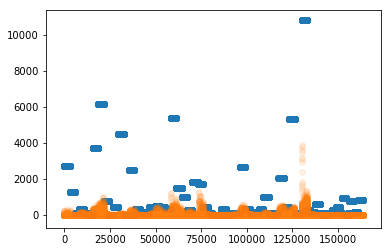

In [11]:
plt.scatter(x,poi_columns[:,0])
plt.scatter(x,labels.gap.values,alpha=0.1)

In [13]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(150,300))
counter=0
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,i*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(i*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

In [14]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(150,300))
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

In [15]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(150,300))
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

In [16]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(150,300))
print counter
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

15


In [17]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(150,300))
print counter*12
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

240


In [18]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(150,300))
print counter*2
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

50


In [19]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(150,300))
print counter*2
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

60


70


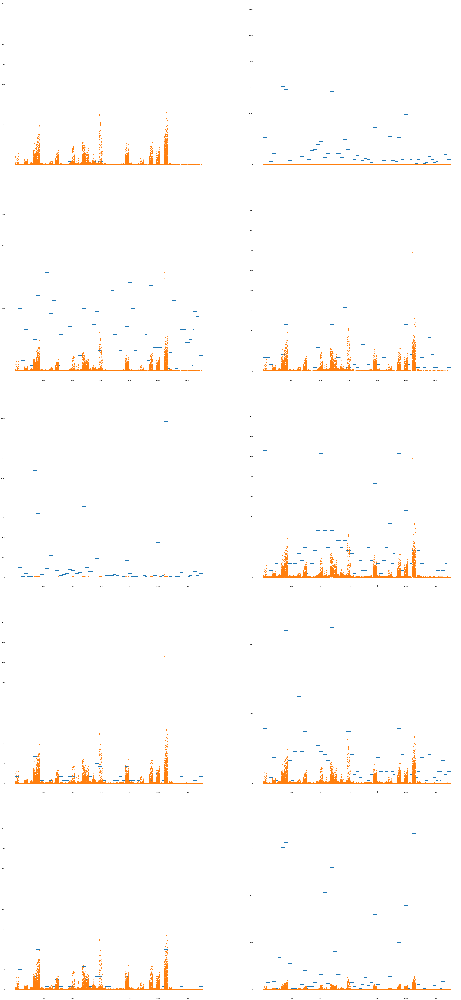

In [20]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(80,180))
print counter*2
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

80


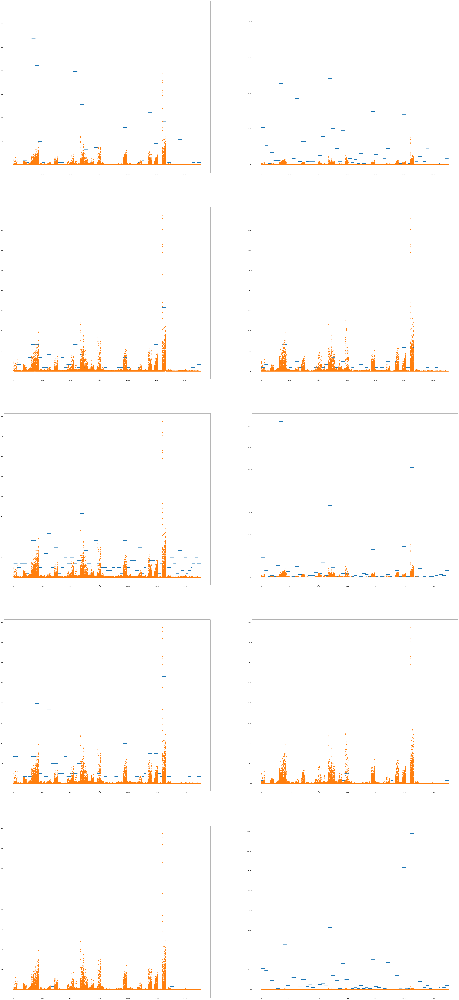

In [21]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(80,180))
print counter*2
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

90


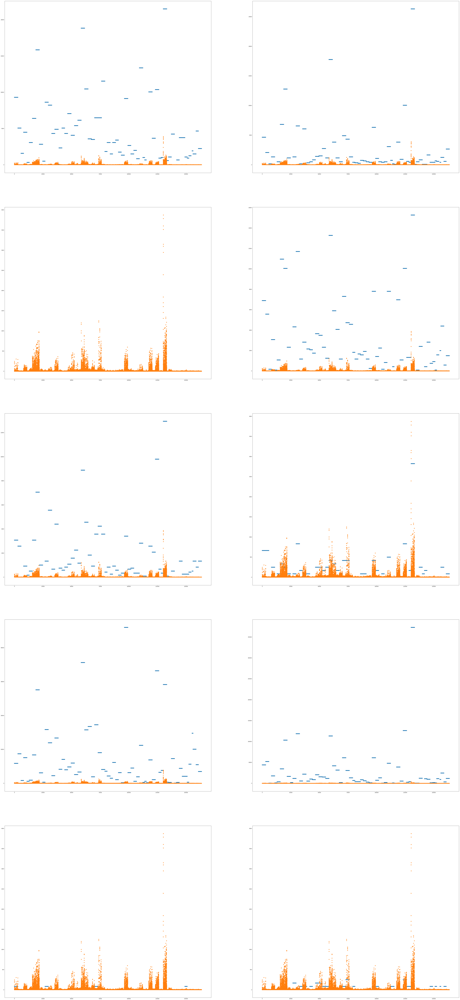

In [22]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(80,180))
print counter*2
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

100


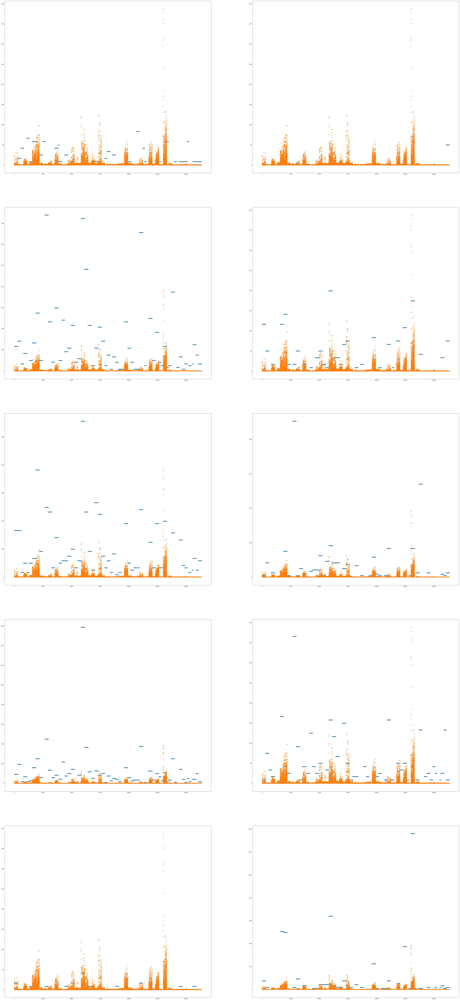

In [23]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(80,180))
print counter*2
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

110


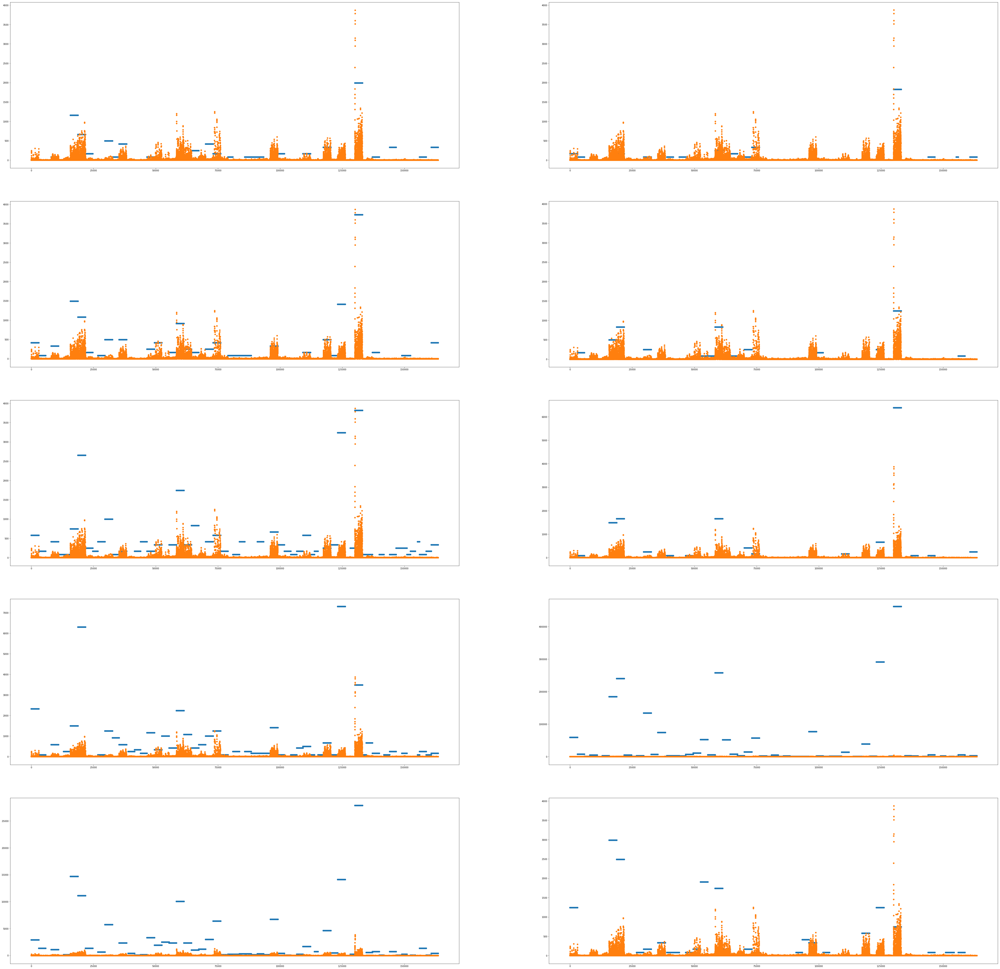

In [24]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(80,80))
print counter*2
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

120


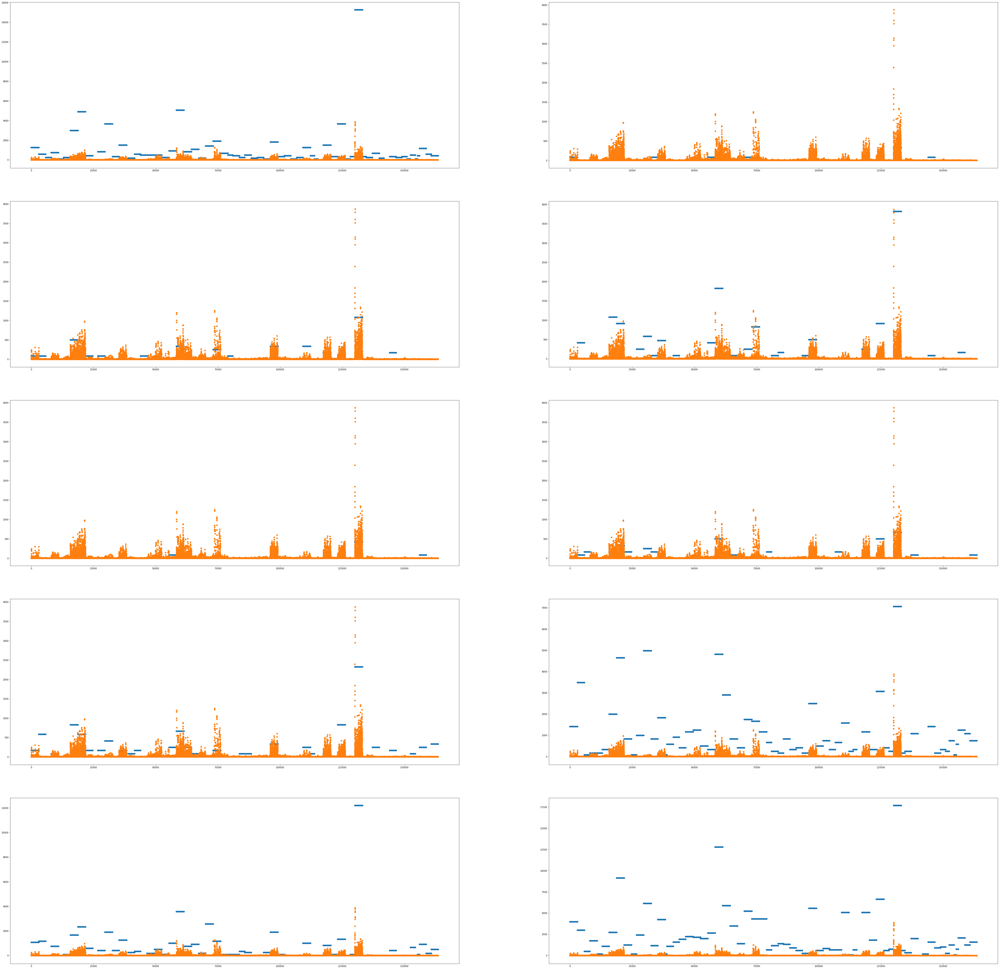

In [25]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(80,80))
print counter*2
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

130


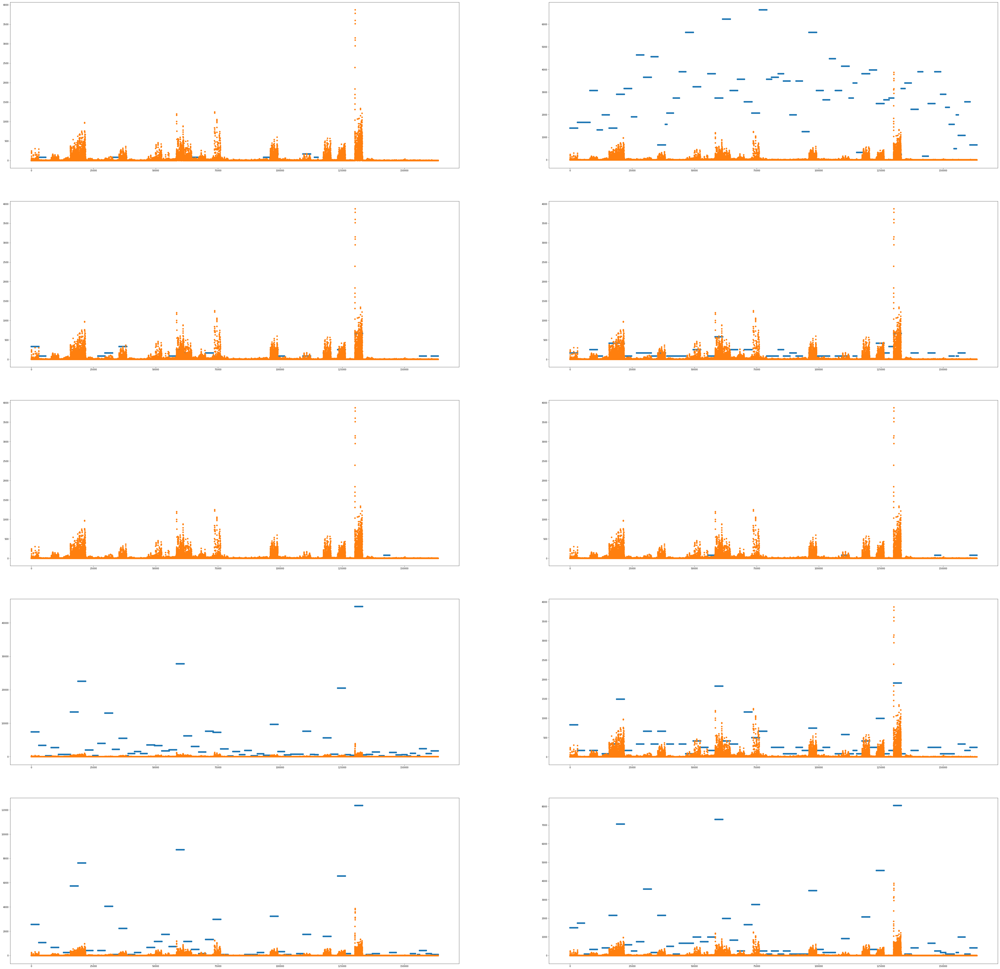

In [26]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(80,80))
print counter*2
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

140


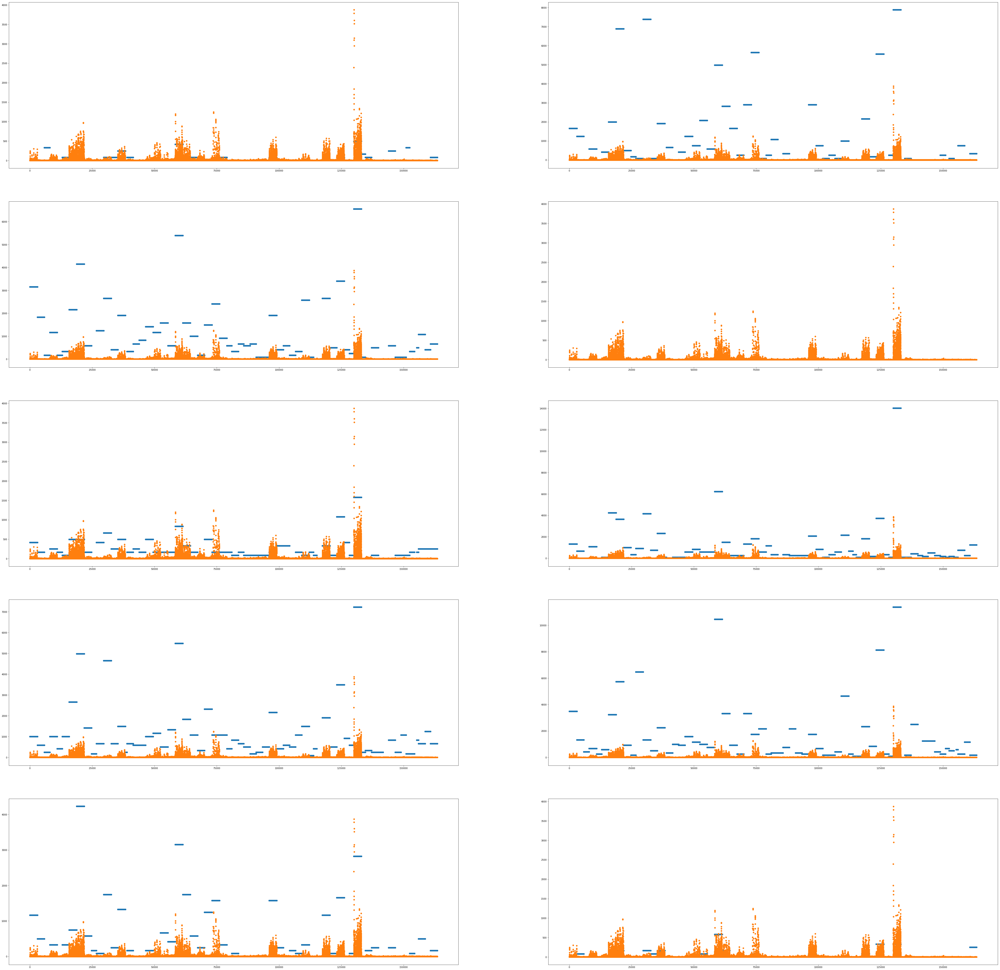

In [27]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(80,80))
print counter*2
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1

150


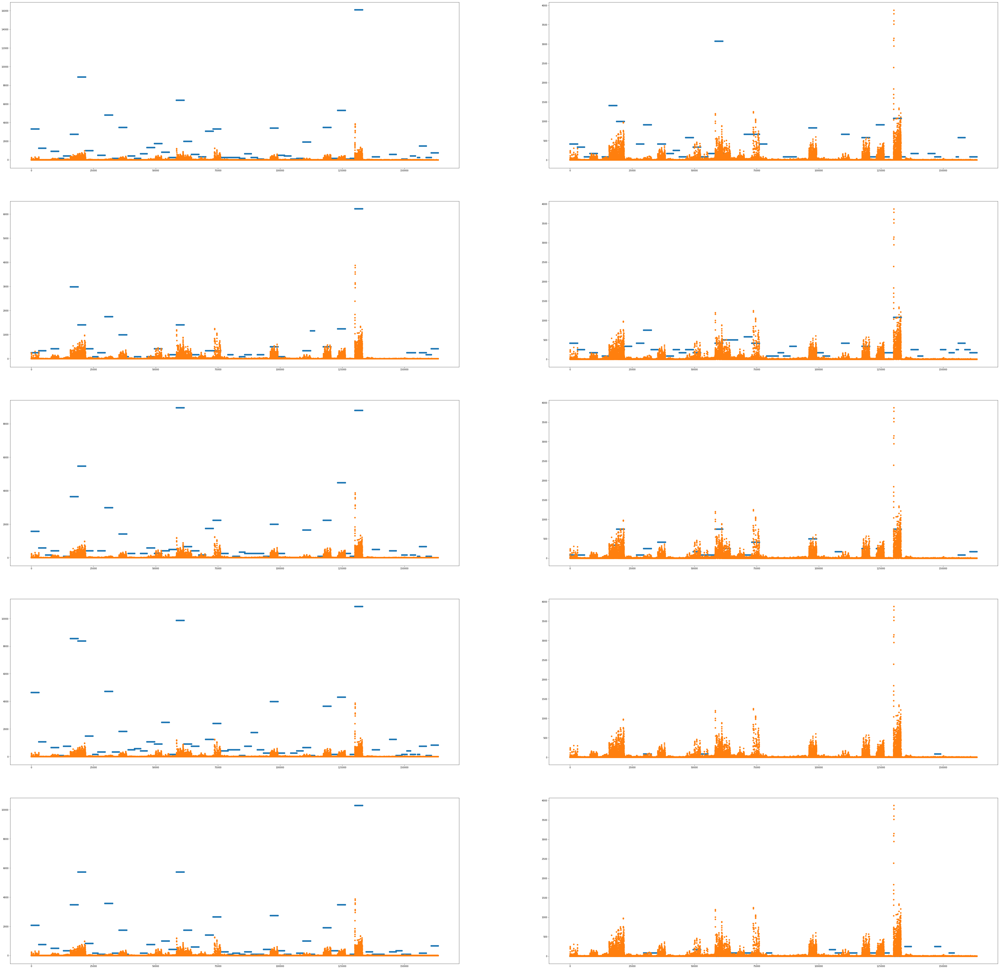

In [28]:
x=np.arange(1,order_data.shape[0]+1,1)
fig,ax=plt.subplots(5,2,figsize=(80,80))
print counter*2
for i in xrange(5):
    ax[i,0].scatter(x,poi_columns[:,counter*2].ravel())
    ax[i,0].scatter(x,labels.gap.values.ravel())
    ax[i,1].scatter(x,poi_columns[:,(counter*2)+1].ravel())
    ax[i,1].scatter(x,labels.gap.values.ravel())
    counter+=1